In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
import tensorflow as tf
from matplotlib.image import imread
print("Number of GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')), "\n")
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers import Cropping2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential

Number of GPUs Available:  1 



In [ ]:
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession

config = ConfigProto()
config.gpu_options.per_process_gpu_memory_fraction = 0.5
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)

In [ ]:
!nvidia-smi

Thu May 12 11:21:12 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   59C    P0    30W /  70W |    264MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
# import the libraries as shown below

from tensorflow.keras.layers import Input, Lambda, Dense, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img
from tensorflow.keras.models import Sequential
import numpy as np
from glob import glob
#import matplotlib.pyplot as plt

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ls '/content/drive/MyDrive'

'ALEXNET (1).ipynb'   Preprocess_13_1.ipynb   VGG16.ipynb
 ALEXNET_2_4.ipynb    Preprocess_14.ipynb     VGG16_yeni.ipynb
'ALEXNET (2).ipynb'   train_test_split_gyb


In [ ]:
train_datagen = ImageDataGenerator(
     rescale=1. / 255,
     width_shift_range=0.2,
     rotation_range=10, 
     height_shift_range=0.2, 
     zoom_range=0.2, 
     horizontal_flip=True,
     fill_mode='nearest',
     brightness_range=[0.5,1.2],
     validation_split=0.2)

test_datagen = ImageDataGenerator(
    rotation_range=10,
    rescale=1. / 255,
    width_shift_range=0.2, 
    height_shift_range=0.2, 
    zoom_range=0.2, 
    horizontal_flip=True, 
    brightness_range=[0.5,1.2]) 

train_generator = train_datagen.flow_from_directory(
    '/content/drive/MyDrive/train_test_split_gyb/data_for_training',
    target_size=(128,128),
    shuffle = True,
    batch_size=16,
    class_mode='categorical',
    seed=2020,
    subset='training')

val_generator = train_datagen.flow_from_directory(
    '/content/drive/MyDrive/train_test_split_gyb/data_for_training',
    target_size=(128,128),
    batch_size=16,
    shuffle = False,
    class_mode='categorical',
    seed=2020,
    subset='validation')

test_generator=test_datagen.flow_from_directory(
    '/content/drive/MyDrive/train_test_split_gyb/data_for_test',
    target_size=(128,128),
    batch_size=16,
    class_mode='categorical',
    seed=2020,
    shuffle = False)

Found 2160 images belonging to 3 classes.
Found 540 images belonging to 3 classes.
Found 300 images belonging to 3 classes.


In [ ]:
IMG_SHAPE = (128,128,3)

# create the base model from the pre-trained model VGG16
# note that, if using a Kaggle server, internet has to be turned on
pretrained_model = tf.keras.applications.vgg16.VGG16(input_shape=IMG_SHAPE,
                                                     include_top=False,
                                                     weights='imagenet')

# freeze the convolutional base
pretrained_model.trainable = False

58900480/58889256 [==============================] - 0s 0us/step


In [ ]:
import os
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
import numpy
for image_batch, label_batch in train_generator:
    print(image_batch.shape)
    break
# image batchler

(16, 128, 128, 3)


In [ ]:
feature_batch = pretrained_model(image_batch)
print(feature_batch.shape)
# 128 boyutta 4 geliyor, 224 de 7 geliyor

(16, 4, 4, 512)


https://miro.medium.com/max/875/1*CrjJwSX9S7f759dK2EtGJQ.png

In [ ]:
pretrained_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 128, 128, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 128, 128, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 64, 64, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 64, 64, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 64, 64, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 32, 32, 128)       0     

In [ ]:
# 512 elemanlı vector ımages
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

feature_batch_average = global_average_layer(feature_batch) # feature_batch_size:(32, 4, 4, 512) pooling ile (32,512) boyutunda vektörleştirilir.
print(feature_batch_average.shape) 

(16, 512)


In [ ]:
# set the initializers with a seed for reproducible behaviour Tek bir tahmin i.in dense layer
prediction_layer = tf.keras.layers.Dense(3, activation='sigmoid',name='output')

prediction_batch = prediction_layer(feature_batch_average)
print(prediction_batch.shape)

(16, 3)


In [ ]:
model = tf.keras.Sequential([pretrained_model,
                             global_average_layer,
                             prediction_layer])

In [ ]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 4, 4, 512)         14714688  
                                                                 
 global_average_pooling2d (G  (None, 512)              0         
 lobalAveragePooling2D)                                          
                                                                 
 output (Dense)              (None, 3)                 1539      
                                                                 
Total params: 14,716,227
Trainable params: 1,539
Non-trainable params: 14,714,688
_________________________________________________________________


In [ ]:
batch_size = 16
history = model.fit(
  train_generator,
  validation_data=val_generator,
  epochs=80,
  steps_per_epoch=train_generator.samples//batch_size,
  validation_steps=val_generator.samples//batch_size
)

Epoch 1/80
135/135 [==============================] - 500s 4s/step - loss: 0.6674 - accuracy: 0.3347 - val_loss: 0.6429 - val_accuracy: 0.3201
Epoch 2/80
135/135 [==============================] - 23s 167ms/step - loss: 0.6248 - accuracy: 0.4181 - val_loss: 0.6198 - val_accuracy: 0.4602
Epoch 3/80
135/135 [==============================] - 22s 166ms/step - loss: 0.6071 - accuracy: 0.5185 - val_loss: 0.6004 - val_accuracy: 0.5739
Epoch 4/80
135/135 [==============================] - 22s 165ms/step - loss: 0.5936 - accuracy: 0.5889 - val_loss: 0.5888 - val_accuracy: 0.6061
Epoch 5/80
135/135 [==============================] - 22s 165ms/step - loss: 0.5804 - accuracy: 0.6139 - val_loss: 0.5791 - val_accuracy: 0.6420
Epoch 6/80
135/135 [==============================] - 22s 165ms/step - loss: 0.5684 - accuracy: 0.6356 - val_loss: 0.5650 - val_accuracy: 0.6515
Epoch 7/80
135/135 [==============================] - 22s 163ms/step - loss: 0.5598 - accuracy: 0.6481 - val_loss: 0.5541 - val_accu

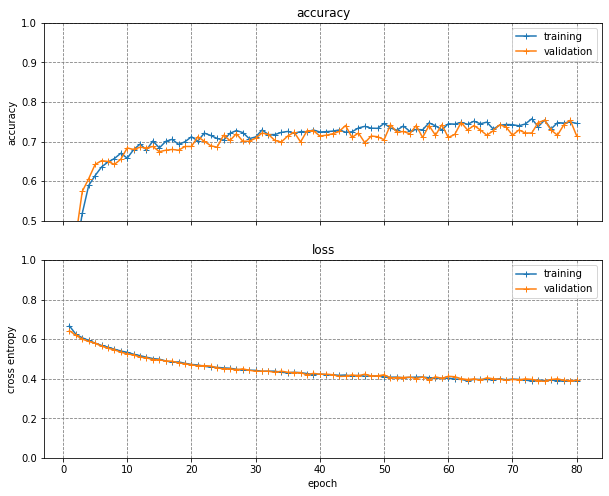

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(10,8), sharex=True)

x_plot = np.arange(1, 80+1)

ax[0].plot(x_plot, acc, '+-', label='training')
ax[0].plot(x_plot, val_acc, '+-', label='validation')
ax[0].legend()
ax[0].set_ylabel('accuracy')
ax[0].set_ylim(0.5, 1)
ax[0].grid(ls='--', c='C7')
ax[0].set_title('accuracy')

ax[1].plot(x_plot, loss, '+-', label='training')
ax[1].plot(x_plot, val_loss, '+-', label='validation')
ax[1].legend()
ax[1].set_ylabel('cross entropy')
ax[1].set_ylim(0, 1)
ax[1].grid(ls='--', c='C7')
ax[1].set_title('loss')
ax[1].set_xlabel('epoch')

plt.show()

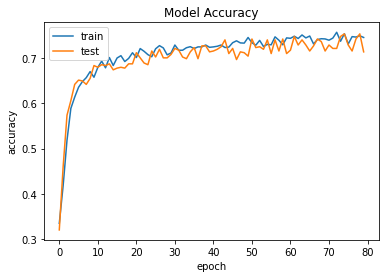

In [ ]:
import matplotlib.pyplot as plt
#plotting the Accuracy of test and training sets
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

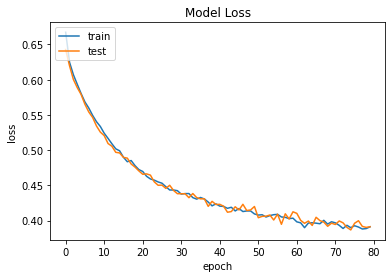

In [ ]:
#plotting the loss of test and training sets
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [ ]:
y_pred = model.predict(test_generator)
y_pred = np.argmax(y_pred,axis=1)

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(test_generator.labels,y_pred))

              precision    recall  f1-score   support

           0       0.89      0.92      0.91       100
           1       0.81      0.47      0.59       100
           2       0.69      0.96      0.80       100

    accuracy                           0.78       300
   macro avg       0.80      0.78      0.77       300
weighted avg       0.80      0.78      0.77       300



In [ ]:
import pandas as pd
classes=['comp','mod','neg']
con_mat_df = pd.DataFrame(confusion_matrix(test_generator.labels,y_pred),
                     index = classes, 
                     columns = classes)

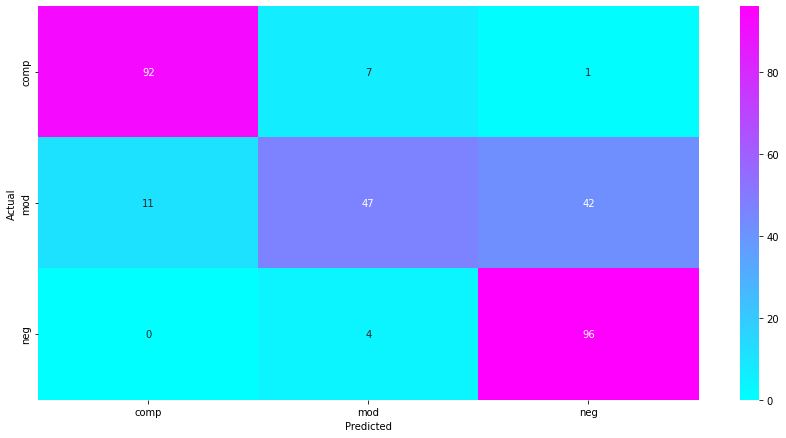

In [ ]:
import seaborn as sns
figure = plt.figure(figsize=(12, 6))
sns.heatmap(con_mat_df, annot=True,cmap=plt.cm.cool,fmt='d')
plt.tight_layout()
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

Fine tuning'in (İnce ayar) amacı, genel öğrenmenin üzerine yazmak yerine bu özel özellikleri yeni veri kümesiyle çalışacak şekilde uyarlamaktır.

Önceden eğitilmiş modelin yalnızca az sayıda üst katmanında ince ayar yapılmalıdır.

In [ ]:
# unfreeze the layers model katmanları eğitilebilir hale getirilir
pretrained_model.trainable = True 

# let's take a look to see how many layers are in the base model toplam eğitileblecek layer sayısı 19
print("Number of layers in the pre-trained model: ", len(pretrained_model.layers))

Number of layers in the pre-trained model:  19


In [ ]:
# fine-tune from this layer onwards
fine_tune_at = 15

# freeze all the layers before the `fine_tune_at` layer 15.layerden sonrasını eğitime kat
for layer in pretrained_model.layers[:fine_tune_at]:
  layer.trainable =  False

In [ ]:
# Base modelin de bazı layerları yeniden eğitileceğinden Overfitting'in önüne geçmek iç lr baya düşürülür
model.compile(optimizer=tf.keras.optimizers.Adam(lr=base_learning_rate/75),
              loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 4, 4, 512)         14714688  
                                                                 
 global_average_pooling2d (G  (None, 512)              0         
 lobalAveragePooling2D)                                          
                                                                 
 output (Dense)              (None, 3)                 1539      
                                                                 
Total params: 14,716,227
Trainable params: 7,080,963
Non-trainable params: 7,635,264
_________________________________________________________________


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [ ]:
len(model.trainable_variables)

8

In [ ]:
# base modelde elden edilen 15. epochun üstüne base ın bazı layerları ve yeni oluşturulan sınıflayıcı layerlara train işlemi yapılır
fine_tune_epochs = 20
total_epochs =  80 + fine_tune_epochs

history_fine = model.fit(train_generator,
                         epochs=total_epochs,
                         initial_epoch=history.epoch[-1]+1,
                         validation_data=val_generator,
                         validation_steps=val_generator.samples//batch_size)

Epoch 81/100


/usr/local/lib/python3.7/dist-packages/tensorflow/python/util/dispatch.py:1082: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  return dispatch_target(*args, **kwargs)


135/135 [==============================] - 25s 170ms/step - loss: 0.3751 - accuracy: 0.7426 - val_loss: 0.3665 - val_accuracy: 0.7879
Epoch 82/100
135/135 [==============================] - 26s 189ms/step - loss: 0.3573 - accuracy: 0.7750 - val_loss: 0.3569 - val_accuracy: 0.7708
Epoch 83/100
135/135 [==============================] - 23s 170ms/step - loss: 0.3420 - accuracy: 0.7782 - val_loss: 0.3414 - val_accuracy: 0.7822
Epoch 84/100
135/135 [==============================] - 23s 167ms/step - loss: 0.3393 - accuracy: 0.7773 - val_loss: 0.3407 - val_accuracy: 0.7765
Epoch 85/100
135/135 [==============================] - 23s 170ms/step - loss: 0.3261 - accuracy: 0.7889 - val_loss: 0.3344 - val_accuracy: 0.7822
Epoch 86/100
135/135 [==============================] - 23s 168ms/step - loss: 0.3245 - accuracy: 0.7981 - val_loss: 0.3301 - val_accuracy: 0.7727
Epoch 87/100
135/135 [==============================] - 23s 169ms/step - loss: 0.3167 - accuracy: 0.7889 - val_loss: 0.3143 - val_a

In [ ]:
acc += history_fine.history['accuracy']
val_acc += history_fine.history['val_accuracy']

loss += history_fine.history['loss']
val_loss += history_fine.history['val_loss']


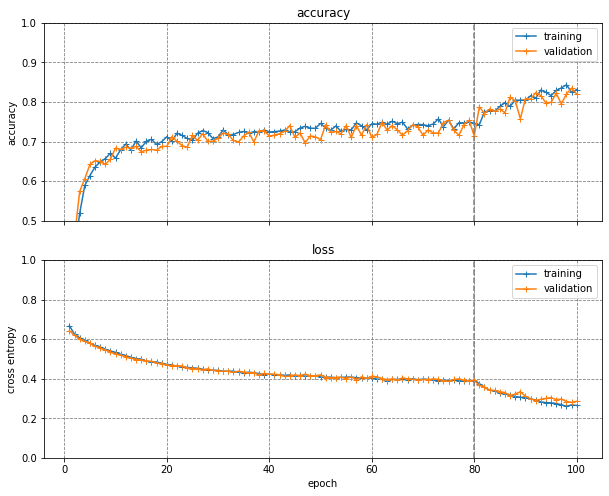

In [ ]:
fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(10,8), sharex=True)
x_plot = np.arange(1, total_epochs+1)
ax[0].plot(x_plot, acc, '+-', label='training')
ax[0].plot(x_plot, val_acc, '+-', label='validation')
ax[0].legend()
ax[0].set_ylabel('accuracy')
ax[0].set_ylim(0.5, 1)
ax[0].grid(ls='--', c='C7')
ax[0].set_title('accuracy')
ax[0].axvline(80, c='C7', ls='--')

ax[1].plot(x_plot, loss, '+-', label='training')
ax[1].plot(x_plot, val_loss, '+-', label='validation')
ax[1].legend()
ax[1].set_ylabel('cross entropy')
ax[1].set_ylim(0, 1)
ax[1].grid(ls='--', c='C7')
ax[1].set_title('loss')
ax[1].set_xlabel('epoch')
ax[1].axvline(80, c='C7', ls='--')

plt.show()

In [ ]:
# validation evalute
val_loss, val_accuracy = model.evaluate(val_generator)

34/34 [==============================] - 4s 128ms/step - loss: 0.2924 - accuracy: 0.8185


In [ ]:
# test evalute
test_loss, test_accuracy = model.evaluate(test_generator)

19/19 [==============================] - 2s 127ms/step - loss: 0.2432 - accuracy: 0.8500


In [ ]:
y_pred = model.predict(test_generator)
y_pred = np.argmax(y_pred,axis=1)

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(test_generator.labels,y_pred))

              precision    recall  f1-score   support

           0       0.93      0.91      0.92       100
           1       0.89      0.62      0.73       100
           2       0.75      0.99      0.85       100

    accuracy                           0.84       300
   macro avg       0.85      0.84      0.83       300
weighted avg       0.85      0.84      0.83       300



In [ ]:
import pandas as pd
classes=['comp','mod','neg']
con_mat_df = pd.DataFrame(confusion_matrix(test_generator.labels,y_pred),
                     index = classes, 
                     columns = classes)

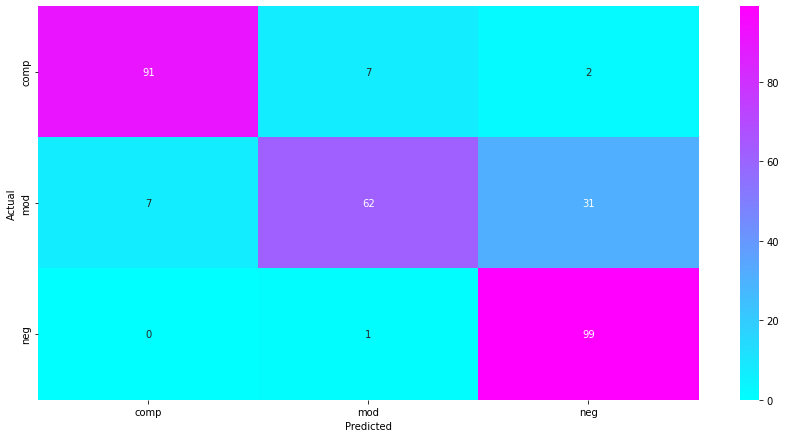

In [ ]:
import seaborn as sns
figure = plt.figure(figsize=(12, 6))
sns.heatmap(con_mat_df, annot=True,cmap=plt.cm.cool,fmt='d')
plt.tight_layout()
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

Found 300 images belonging to 3 classes.
[[0. 1. 0.]]
neg
mod


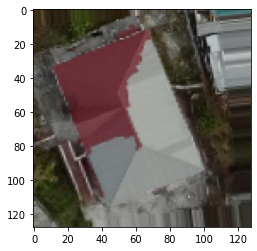

neg
mod


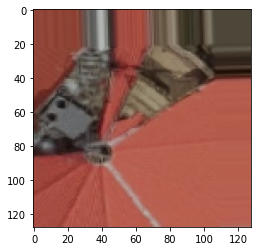

neg
mod


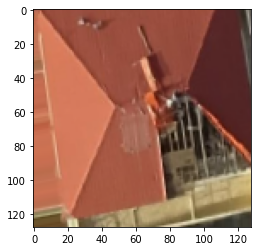

neg
comp


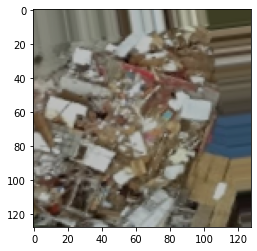

neg
mod


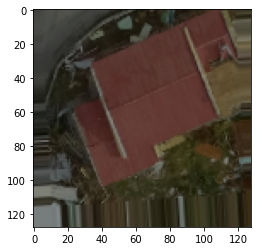

neg
mod


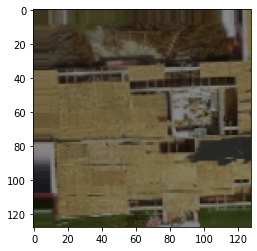

neg
mod


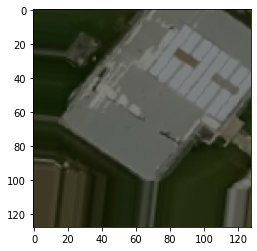

neg
comp


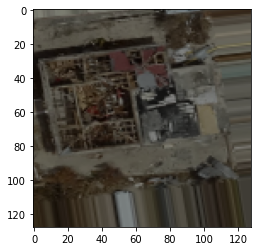

neg
mod


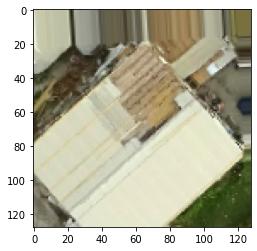

neg
mod


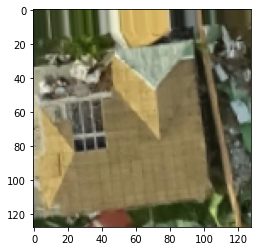

neg
mod


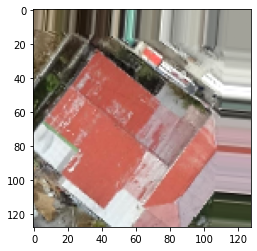

neg
comp


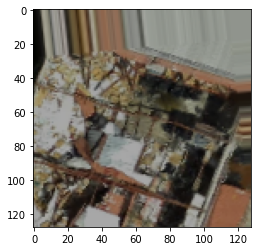

neg
comp


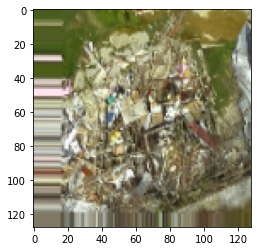

neg
mod


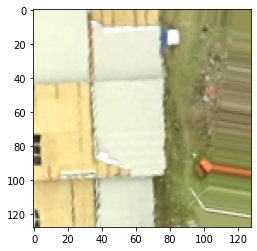

neg
mod


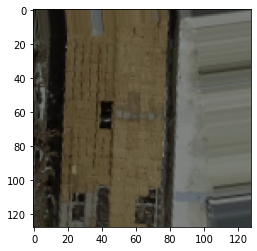

comp
neg


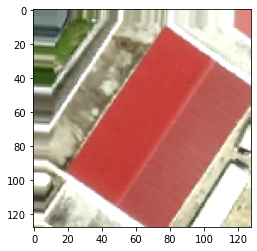

neg
mod


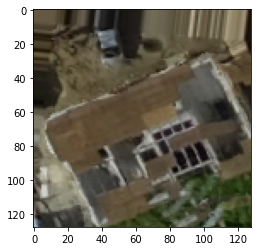

neg
mod


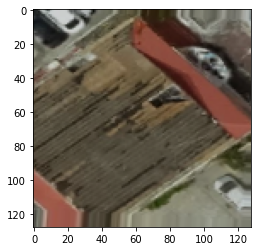

neg
mod


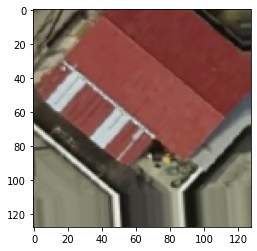

neg
comp


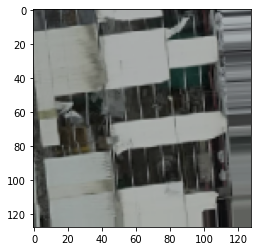

neg
mod


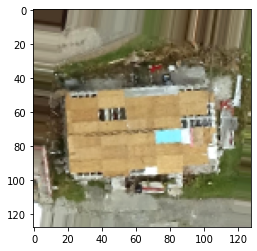

neg
comp


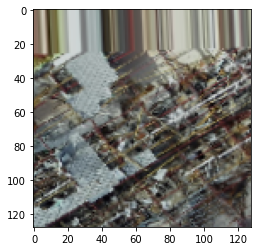

neg
comp


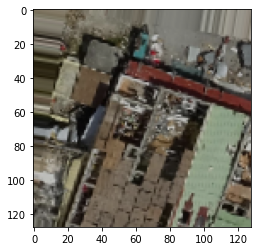

neg
comp


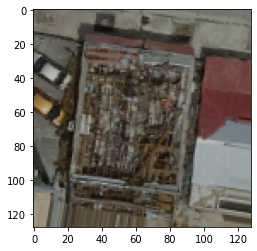

neg
comp


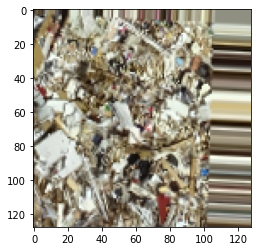

neg
comp


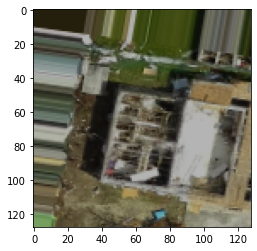

neg
comp


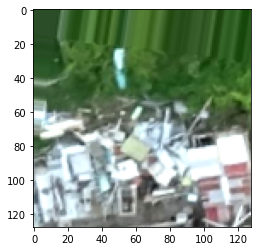

neg
mod


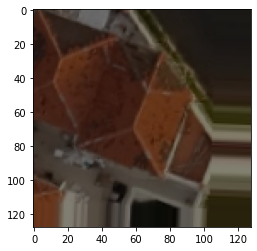

neg
mod


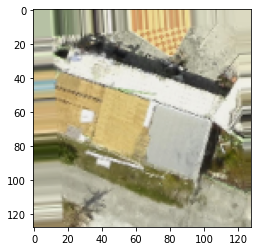

mod
comp


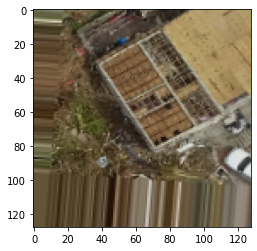

neg
mod


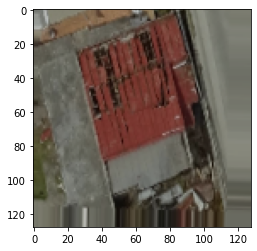

neg
mod


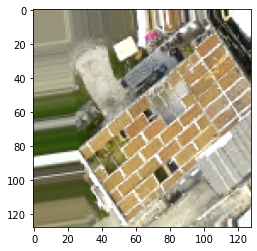

neg
comp


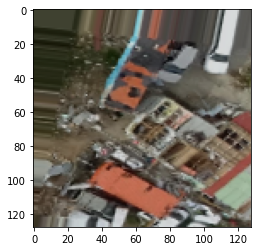

neg
mod


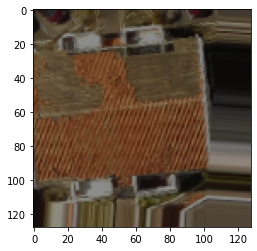

neg
comp


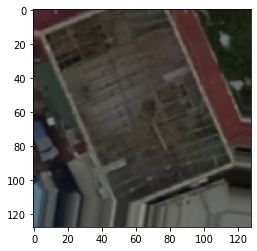

neg
mod


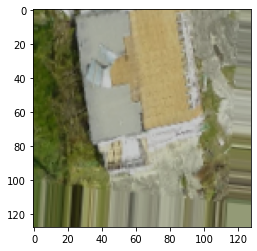

neg
mod


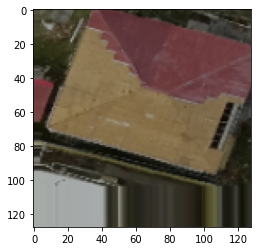

neg
comp


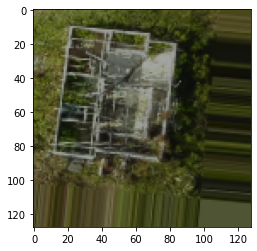

neg
comp


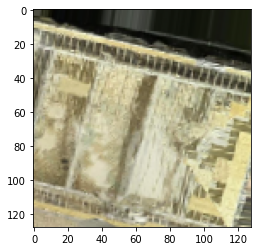

mod
neg


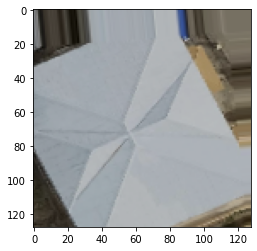

neg
mod


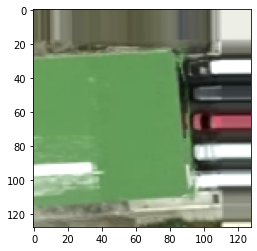

neg
mod


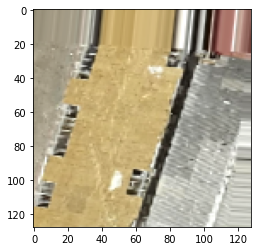

neg
mod


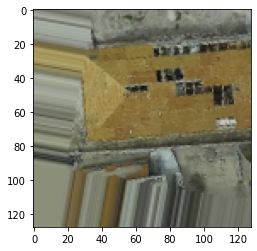

neg
comp


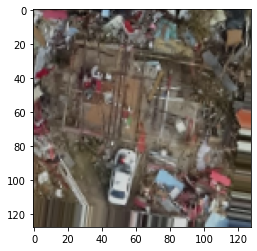

neg
mod


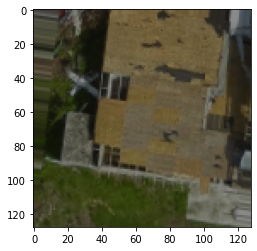

neg
comp


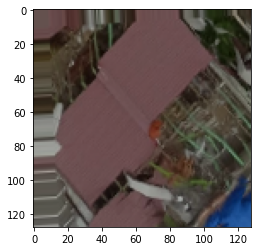

neg
comp


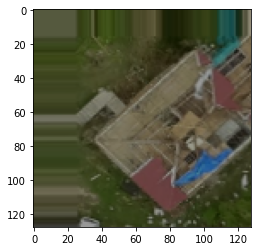

neg
mod


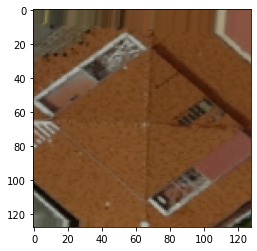

neg
mod


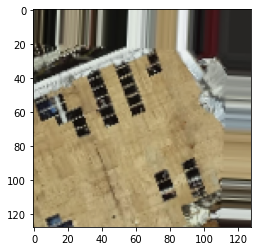

neg
comp


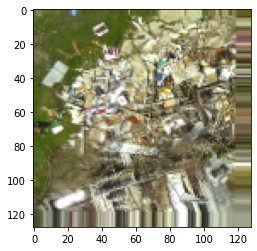

mod
comp


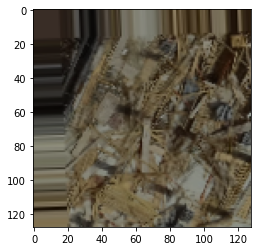

neg
mod


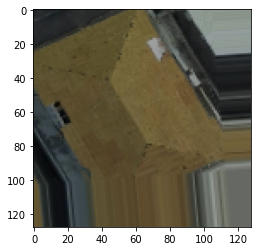

neg
comp


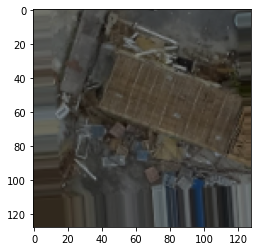

neg
comp


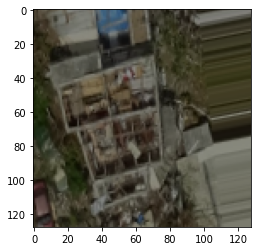

neg
comp


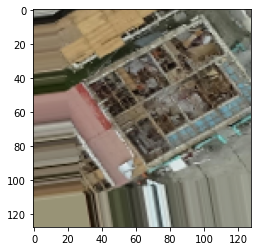

neg
comp


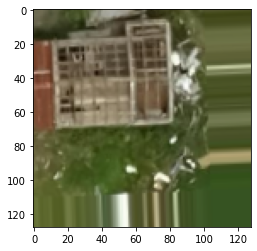

neg
comp


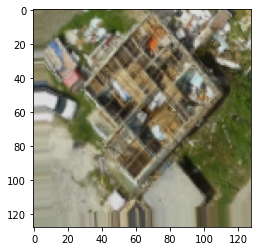

neg
comp


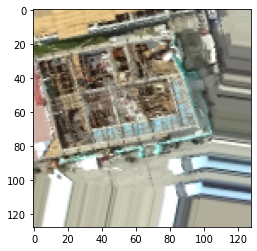

neg
mod


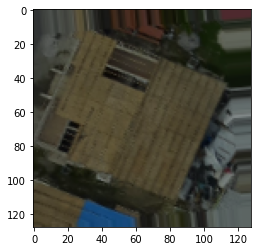

neg
comp


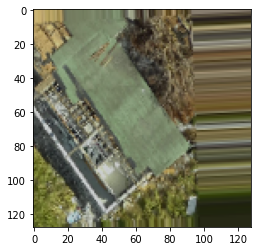

neg
comp


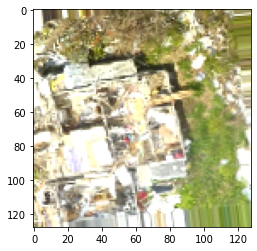

neg
mod


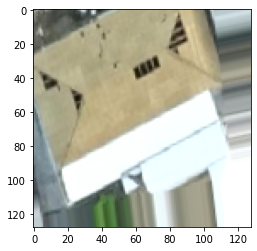

neg
comp


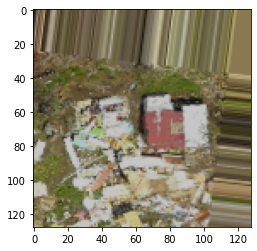

neg
mod


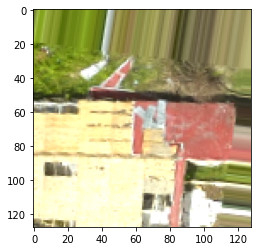

neg
mod


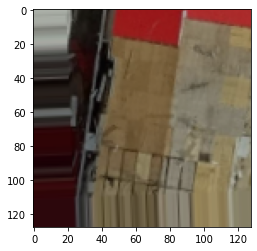

mod
neg


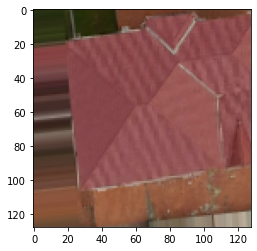

mod
neg


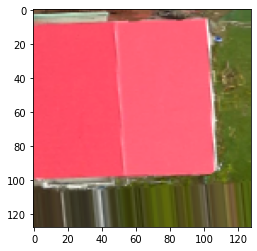

comp
mod


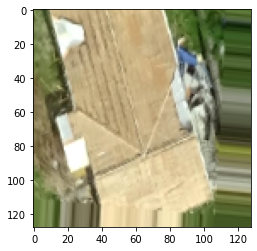

mod
neg


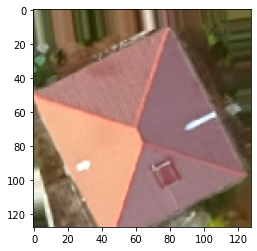

mod
comp


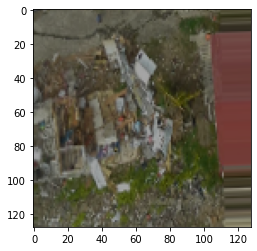

mod
neg


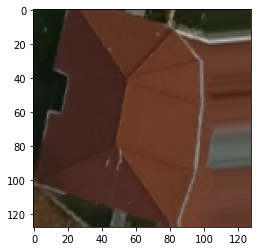

mod
neg


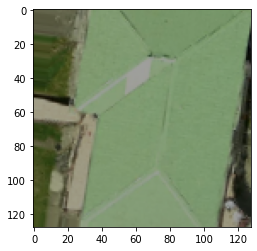

mod
comp


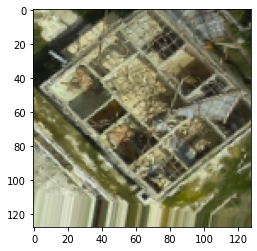

mod
comp


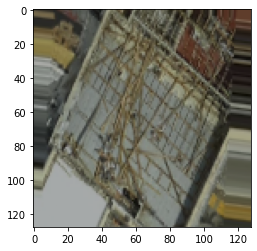

comp
neg


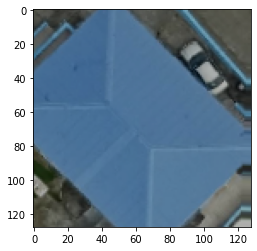

mod
neg


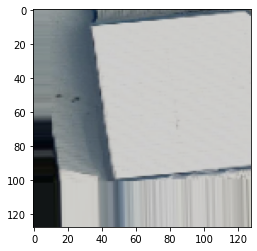

comp
mod


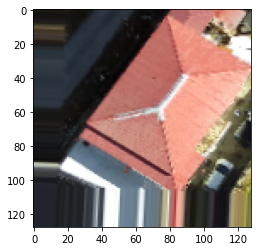

comp
neg


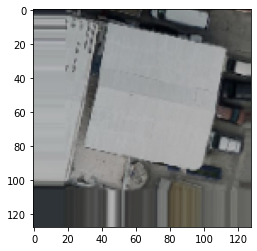

mod
comp


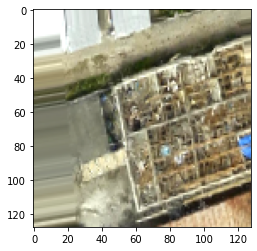

comp
neg


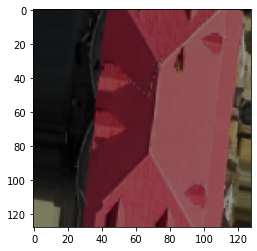

mod
comp


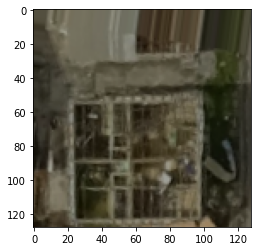

neg
mod


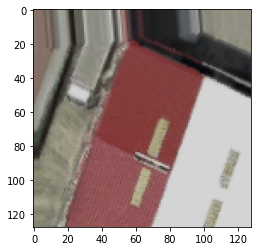

mod
neg


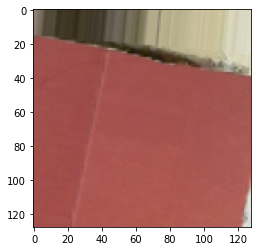

comp
mod


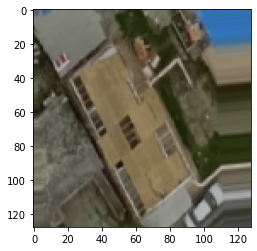

mod
neg


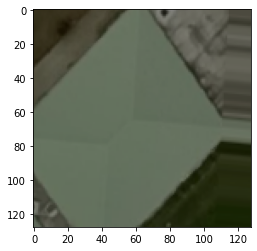

mod
neg


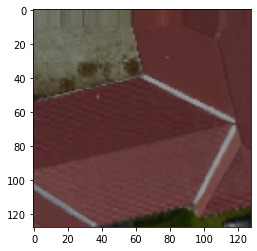

mod
comp


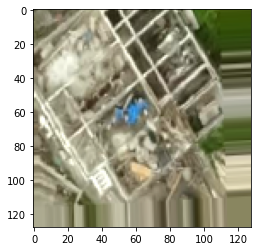

mod
comp


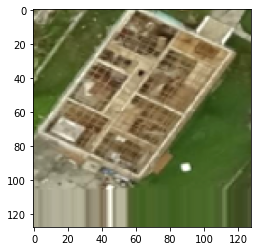

mod
comp


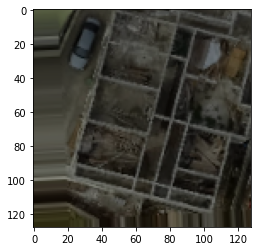

mod
neg


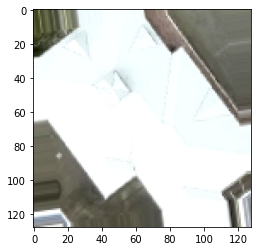

comp
mod


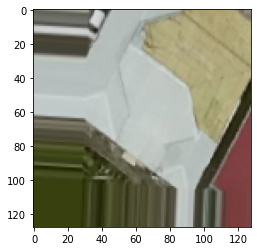

mod
neg


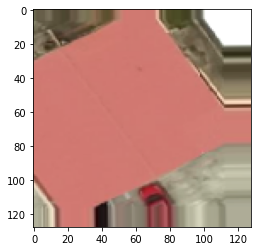

comp
mod


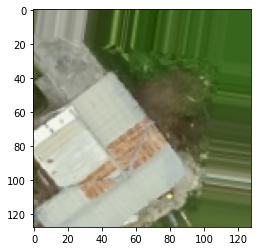

comp
neg


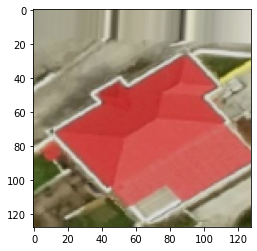

mod
comp


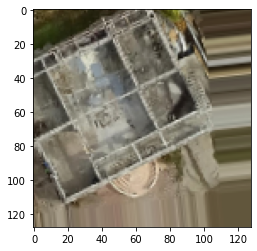

mod
comp


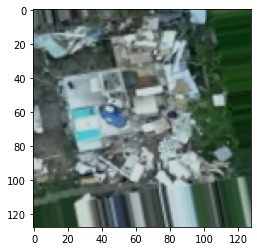

mod
comp


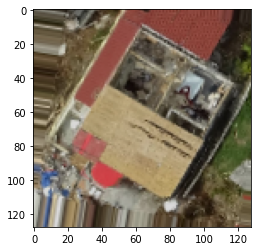

comp
neg


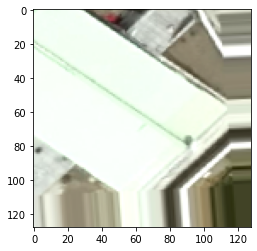

mod
comp


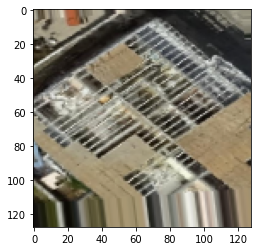

mod
neg


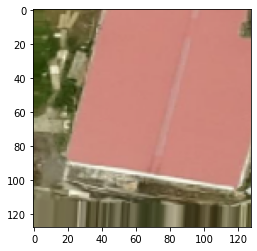

comp
neg


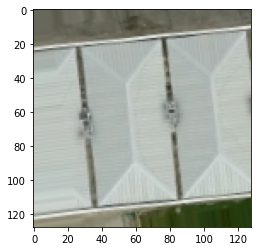

mod
neg


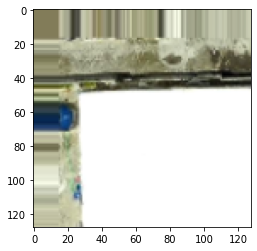

neg
mod


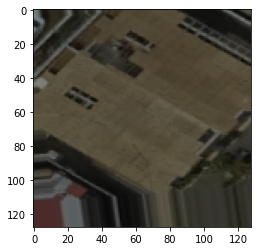

mod
comp


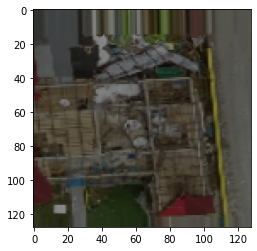

comp
neg


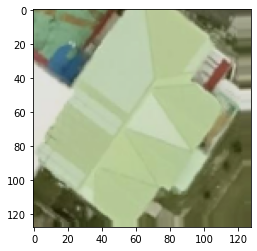

comp
neg


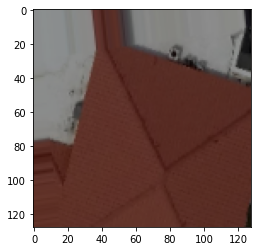

comp
neg


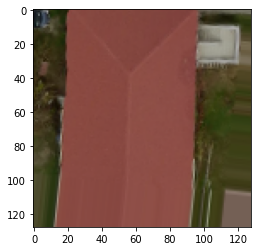

neg
comp


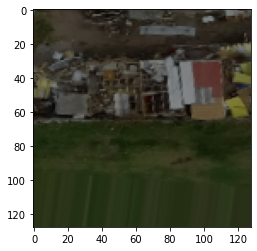

comp
mod


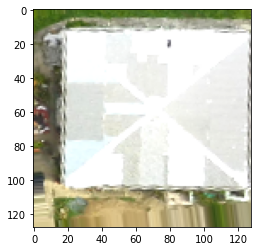

comp
mod


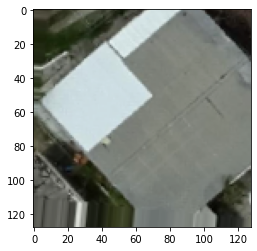

mod
comp


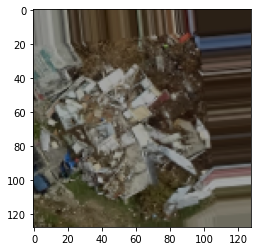

mod
comp


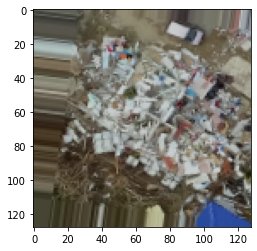

mod
neg


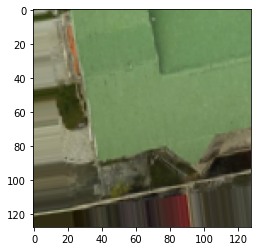

mod
neg


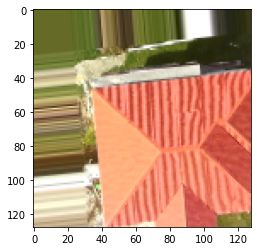

mod
neg


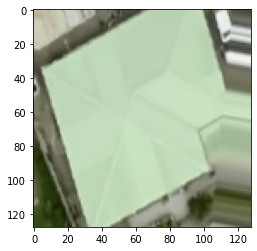

mod
comp


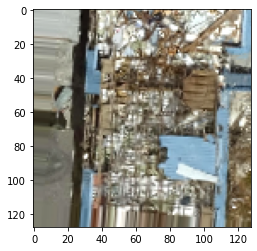

mod
neg


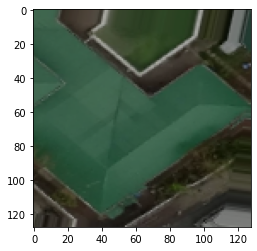

mod
neg


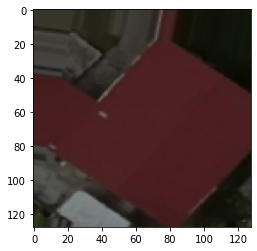

mod
neg


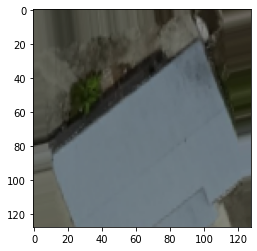

comp
mod


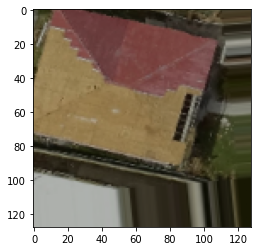

comp
mod


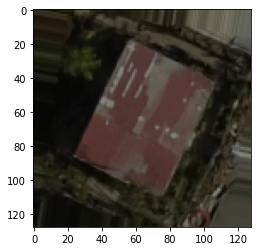

mod
neg


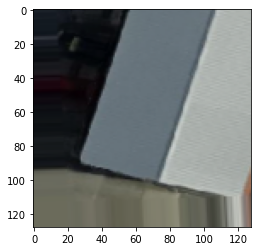

mod
comp


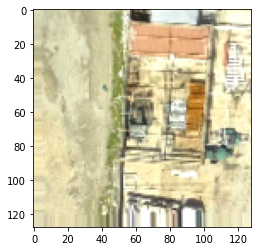

mod
neg


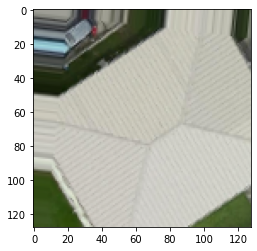

comp
mod


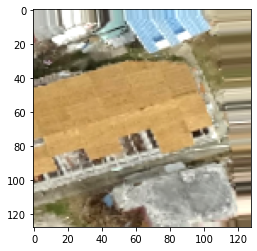

mod
comp


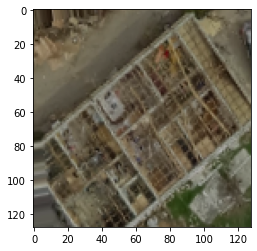

mod
comp


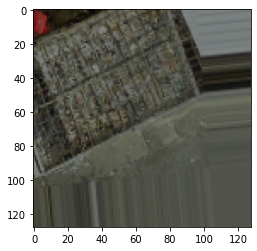

comp
mod


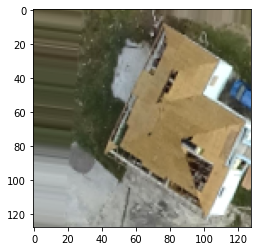

comp
mod


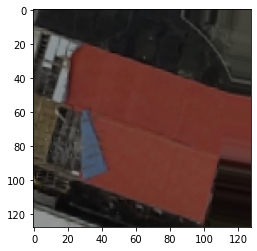

mod
comp


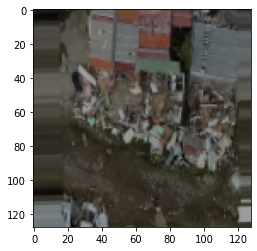

mod
comp


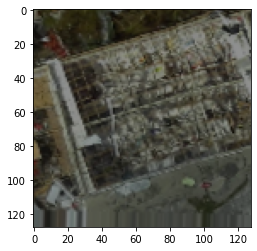

comp
mod


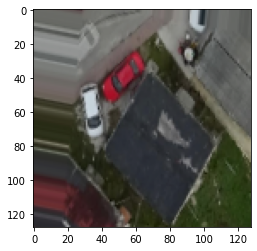

mod
comp


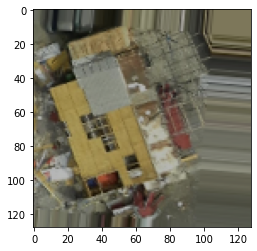

comp
neg


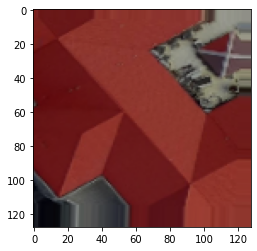

comp
mod


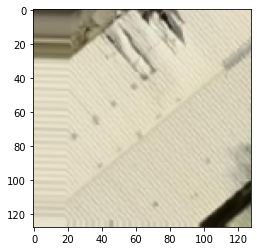

mod
comp


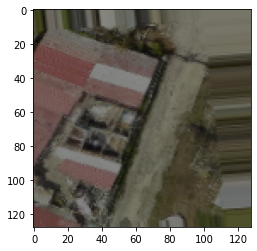

mod
neg


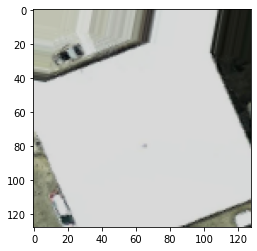

neg
mod


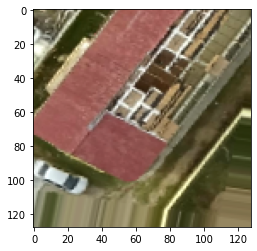

neg
comp


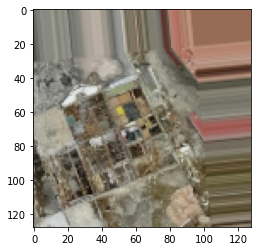

mod
comp


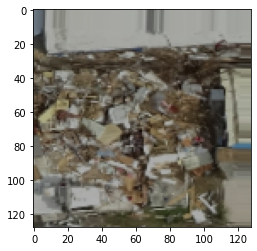

neg
comp


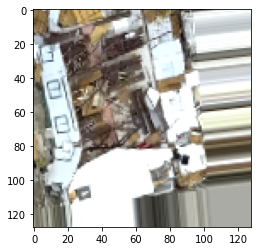

comp
mod


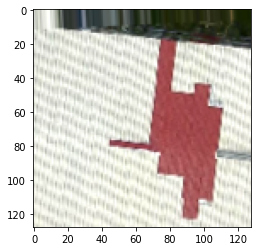

comp
neg


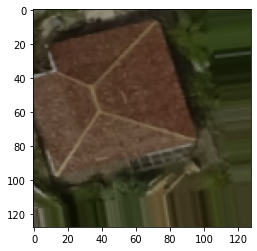

comp
neg


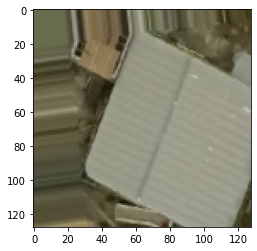

comp
neg


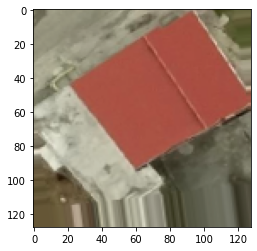

comp
mod


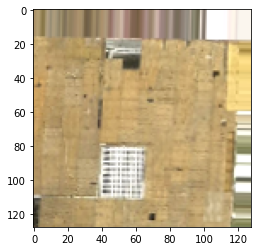

comp
neg


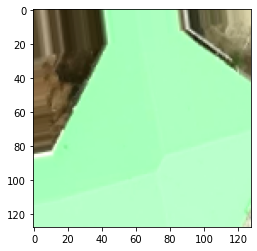

comp
mod


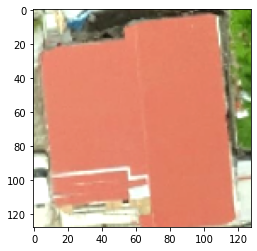

comp
neg


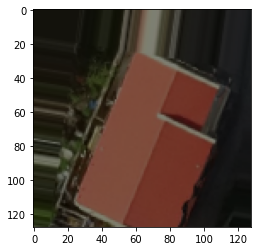

comp
neg


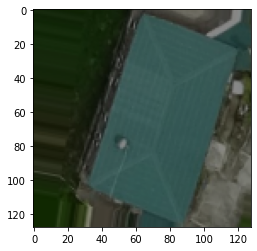

comp
mod


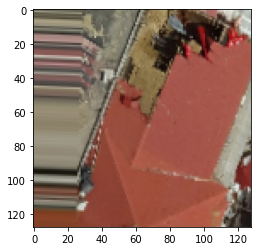

comp
mod


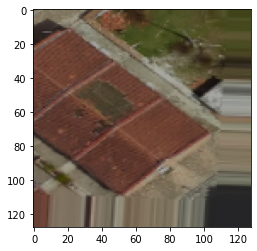

comp
mod


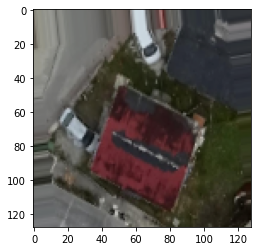

comp
neg


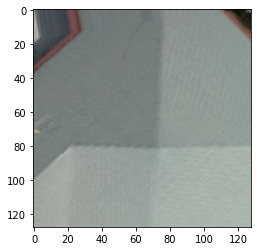

comp
neg


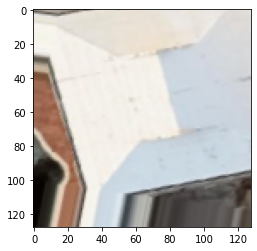

comp
neg


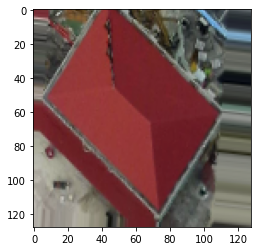

comp
mod


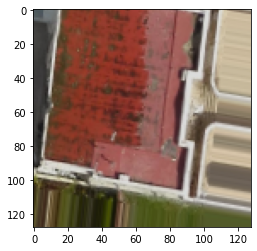

comp
mod


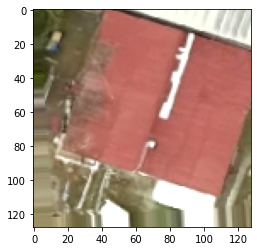

comp
mod


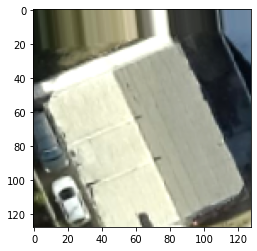

comp
neg


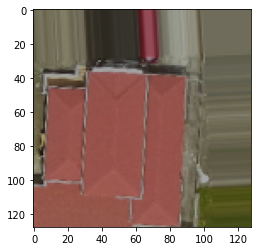

comp
neg


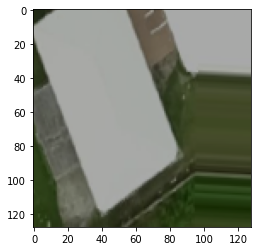

comp
mod


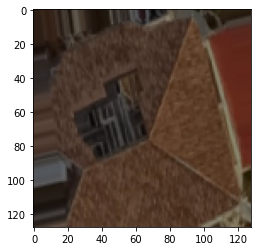

comp
neg


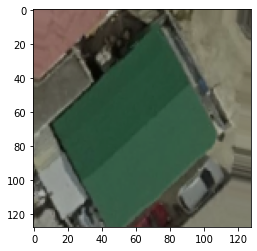

comp
mod


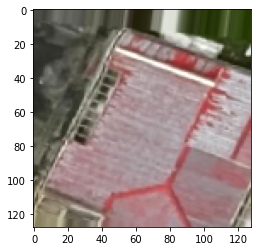

comp
neg


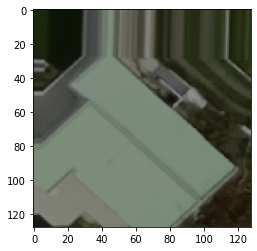

comp
neg


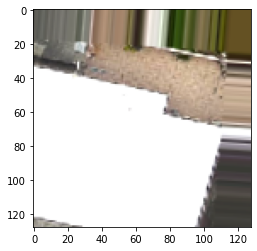

comp
mod


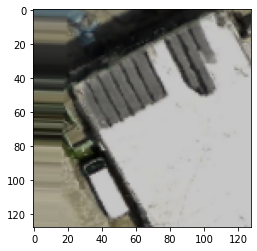

comp
neg


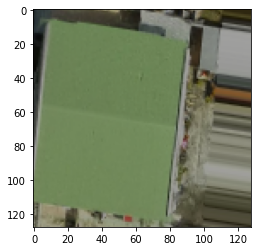

comp
mod


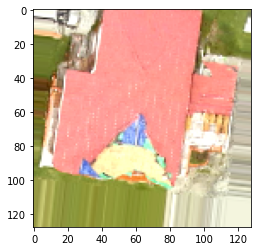

comp
mod


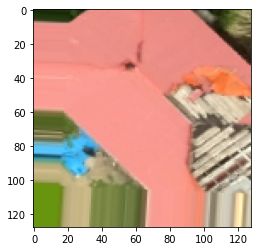

comp
neg


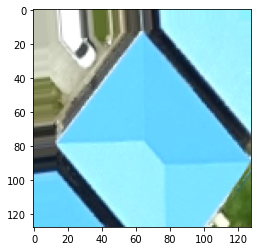

comp
mod


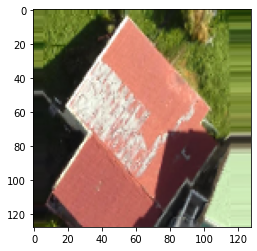

comp
neg


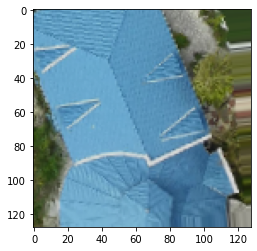

comp
neg


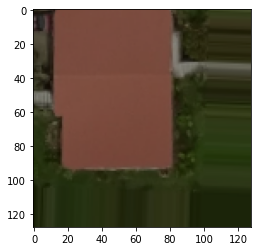

comp
neg


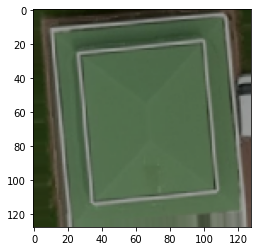

comp
mod


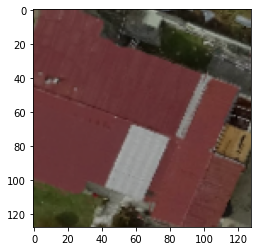

comp
mod


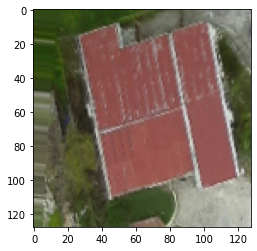

comp
neg


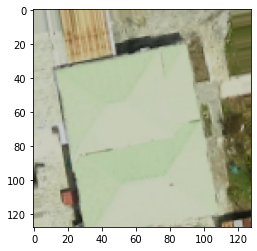

comp
neg


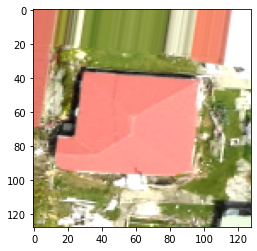

comp
neg


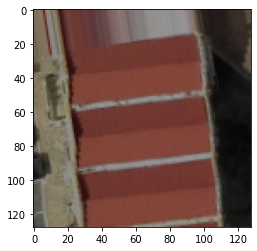

comp
neg


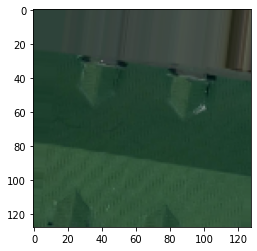

comp
mod


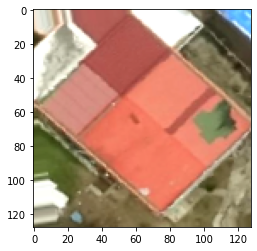

comp
neg


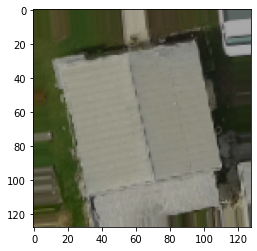

comp
neg


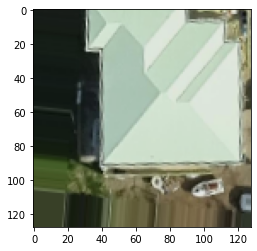

comp
neg


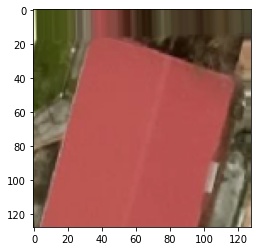

comp
neg


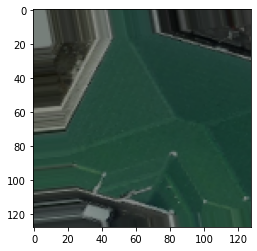

comp
mod


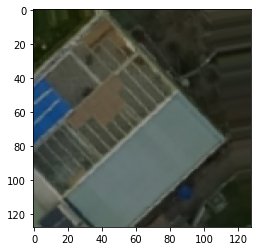

comp
mod


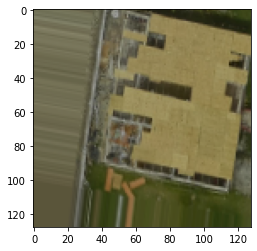

comp
mod


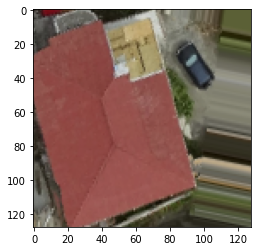

comp
mod


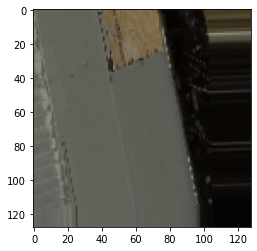

comp
neg


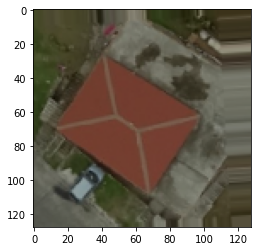

comp
mod


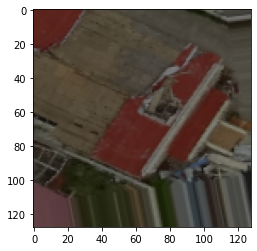

comp
mod


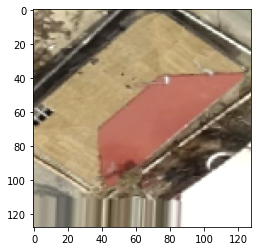

comp
mod


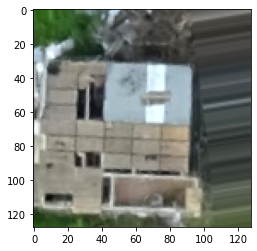

comp
neg


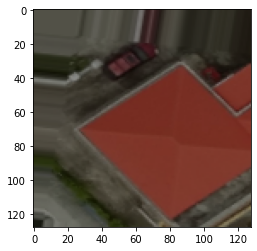

comp
neg


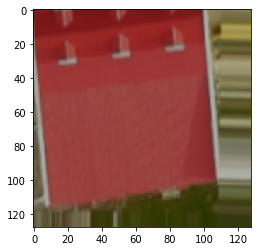

comp
mod


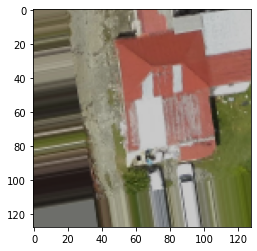

comp
mod


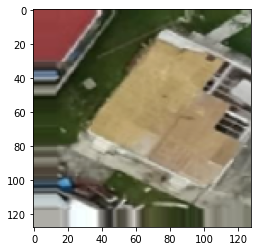

comp
mod


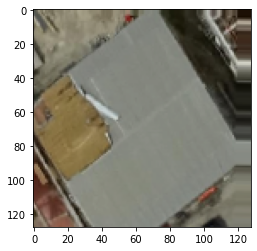

comp
mod


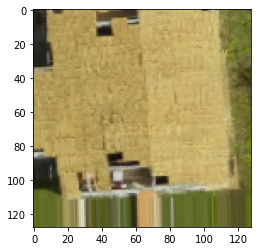

comp
neg


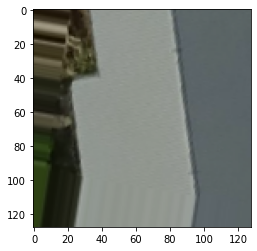

comp
neg


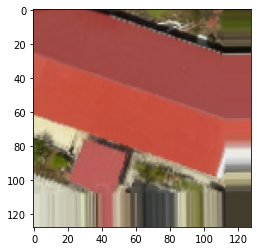

comp
neg


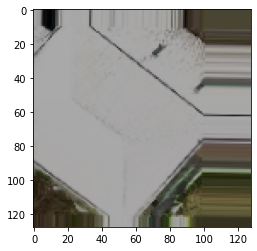

comp
neg


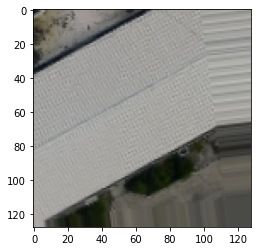

comp
neg


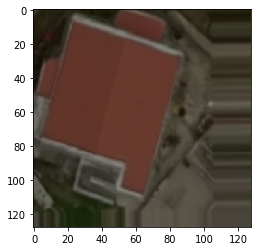

In [ ]:
test_iter = test_datagen.flow_from_directory(
    "/content/drive/MyDrive/train_test_split_gyb/data_for_test/",target_size=(128, 128),
    batch_size=1)

ind_list_cnn = np.argwhere((test_generator.labels == y_pred) == False)[:, -1]

class_name = {0:"comp" , 1 : 'mod', 2: 'neg'}
class_name2= {0:"neg" , 1 : 'mod', 2: 'comp'}


img, label = test_iter[1]
print(label)

for i in range(300):
  img, label = test_iter[i]
  if class_name2[y_pred[i]] != class_name[np.argmax(label)]:
    #print(label)
    print(class_name2[y_pred[i]])
    print(class_name[np.argmax(label)])
    plt.imshow(img[0])
    plt.show()